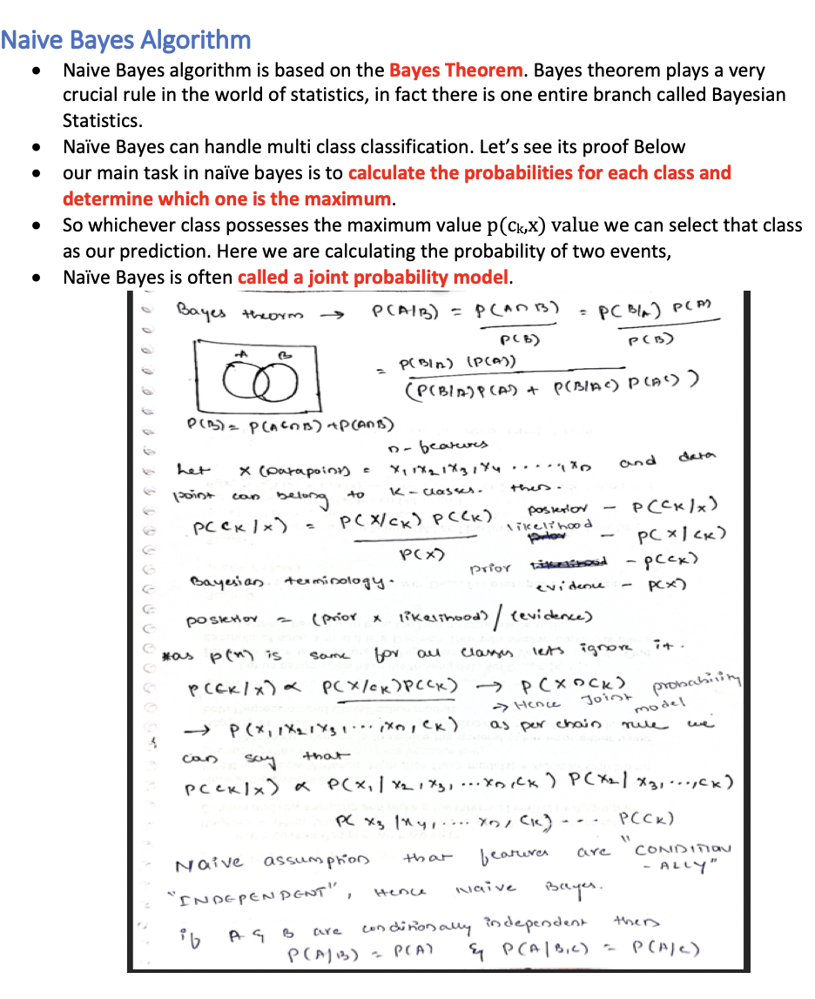

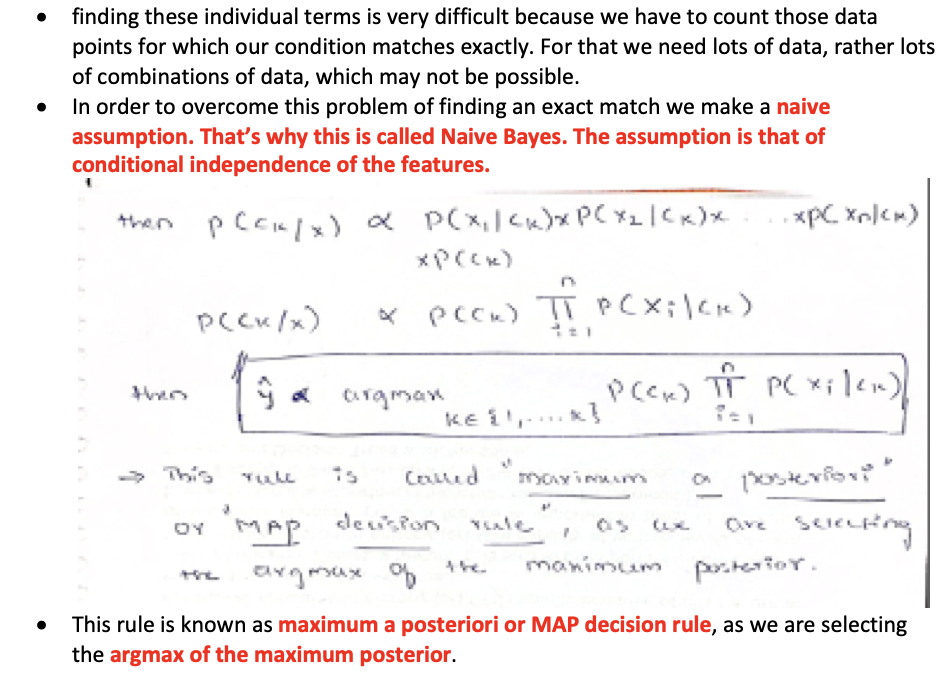

### Time and Space Complexities of Naïve Bayes
 
#### Train Time Complexity:
* Say we have n data points in our dataset and each data point has d dimension. Also say we have c classes. Then if we use a brute force algorithm our time complexity is <b><font color = 'red' >O(ndc). </font></b>
* This is because for calculating the individual probabilities we need to go through each feature i.e. d, n times because we have n data points. This we need to do for c classes.
* If we use some optimization, time complexity can be reduced to O(n). if d is small. Otherwise it is O(nd).

#### Train Space Complexity:

* <b><font color = 'red' >Space Complexity is O(dc)</font></b>, because we need to store the probabilities of each feature i.e. d, c times i.e. no of classes. Also we need to store class probabilities.

#### Test Time Complexity:

* <b><font color = 'red' >Test Time Complexity = O(d*c)</font></b>, where d is the dimension of the data, c is the no of classes. This is because we need to look up d times i.e. for each feature, for each class i.e. c times. We are also considering our lookup time to be constant.
* If we compare NB with KNN, we see that NB is extremely space efficient at runtime because in KNN we need all the data points in memory, whereas NB requires only the look up tables to be in the memory.




#### Naive Bayes on Text Data
* NB is <b><font color = 'red' >extremely useful when it comes to text data.</font></b> One of the earliest spam filters was built using NB. A spam filter classifies a mail into {Spam, Not Spam}. ϵ NB is very efficient in classifying text data into various classes.
* Naive Bayes serves as a very good baseline mode for problems like text classification, polarity of a review etc., A baseline model is like a benchmark.


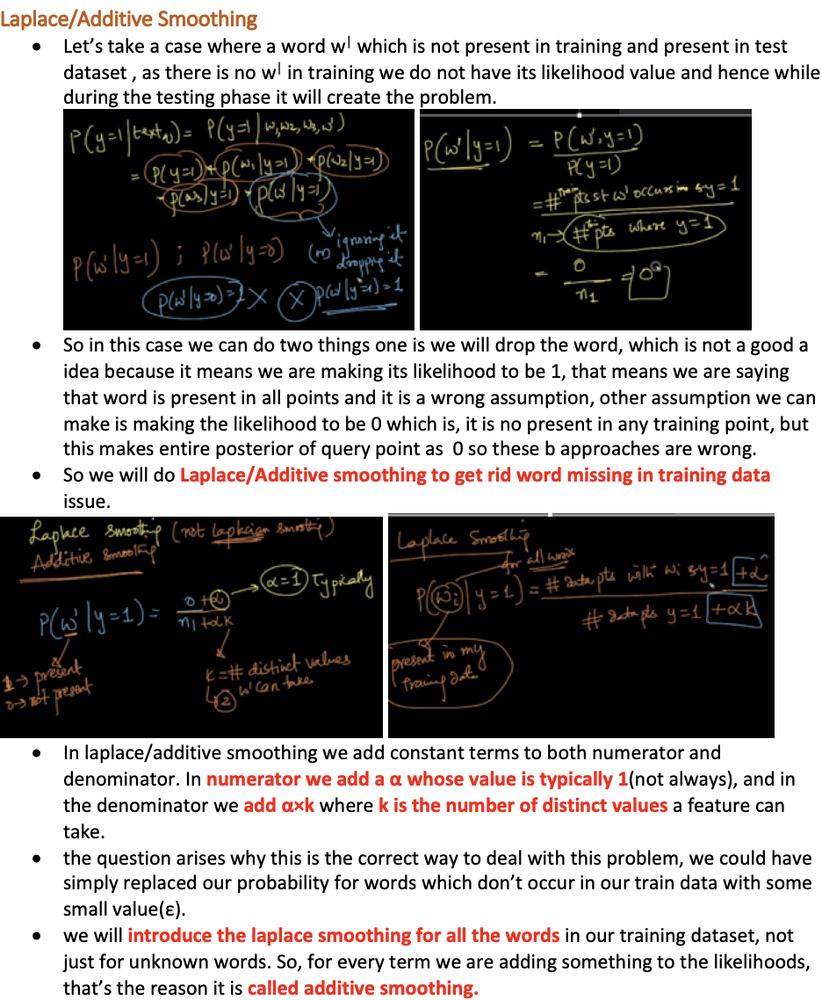


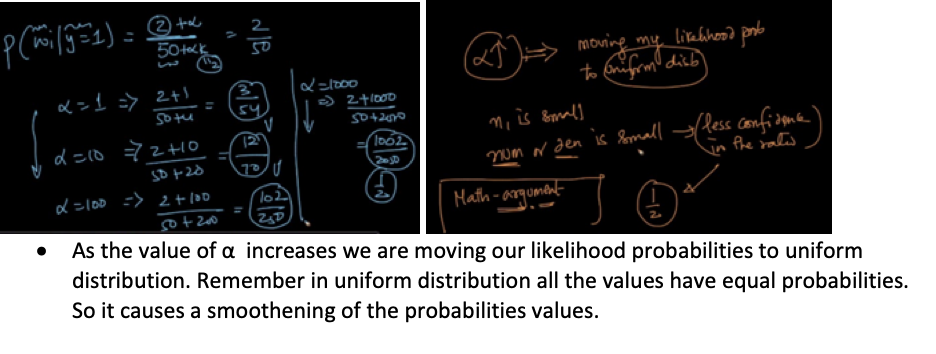

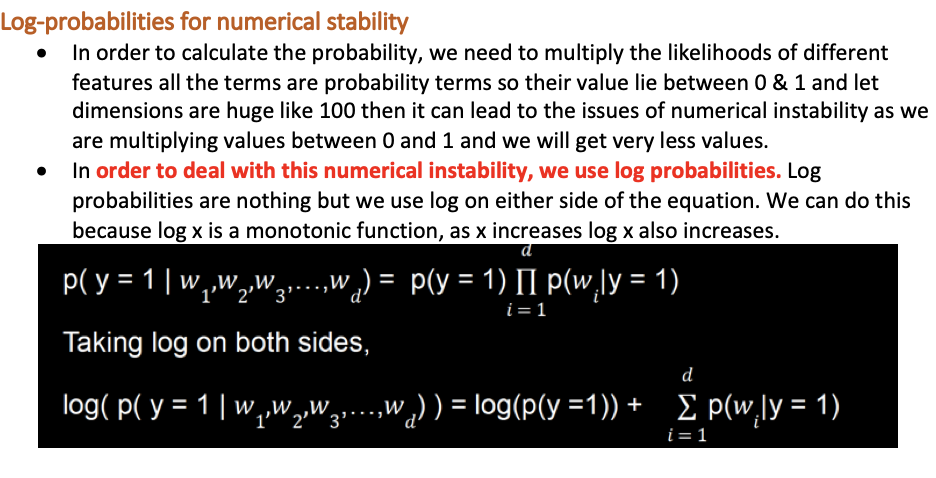

## Best and worst cases
### Best cases:
* If the features are conditionally independent (the fundamental assumption of NB), then our model performs very well. Even if some of the features are slightly correlated then also our model performs reasonably well.
* NB is extremely useful in dealing with high dimensional data as we saw during text classification.
* NB performs very well with categorical features. For real valued features we can use Gaussian NB.
* NB is highly interpretable. Feature importance can also be easily calculated. This makes it suitable for problems where interpretability is important like medical purposes. 
* Also, the time and space complexities for NB is very low when compared to KNN, which makes it useful in low latency solutions. 
* It is also very easy to implement.
### Worst cases: 
* One of the disadvantages of NB is that it can easily overfit. In order to tackle this, we need to do laplace smoothing. We can find the correct value of α using cross-validation.


## Implementing Naive Bayes from Scratch


Importing Section

In [ ]:
import numpy as np 
import pandas as pd 	
import matplotlib.pyplot as plt 
import math

## Sample dataset

* Lets use below dataset for this implementation

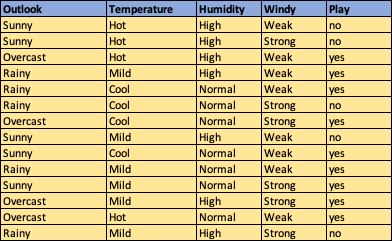


Lets Build dataset

In [ ]:
dataframe = pd.DataFrame()
dataframe["Outlook"] = ["Sunny","Sunny","Overcast","Rainy","Rainy","Rainy","Overcast","Sunny","Sunny","Rainy","Sunny","Overcast","Overcast","Rainy"]
dataframe["Temperature"] = ["Hot","Hot","Hot","Mild","Cool","Cool","Cool","Mild","Cool","Mild","Mild","Mild","Hot","Mild"]
dataframe["Humidity"] = ["High","High","High","High","Normal","Normal","Normal","High","Normal","Normal","Normal","High","Normal","High"]
dataframe["Windy"] = ["Weak","Strong","Weak","Weak","Weak","Strong","Strong","Weak","Weak","Weak","Strong","Strong","Weak","Strong"]
dataframe["Play"] = ["no","no","yes","yes","yes","no","yes","no","yes","yes","yes","yes","yes","no"]
dataframe.head()


,Outlook,Temperature,Humidity,Windy,Play
0,Sunny,Hot,High,Weak,no
1,Sunny,Hot,High,Strong,no
2,Overcast,Hot,High,Weak,yes
3,Rainy,Mild,High,Weak,yes
4,Rainy,Cool,Normal,Weak,yes


In [ ]:
X = dataframe.drop([dataframe.columns[-1]], axis = 1)
y = dataframe[dataframe.columns[-1]]
test_size = 0.25
X_test = X.sample(frac = test_size, random_state = None)
y_test = y[X_test.index]
X_train = X.drop(X_test.index)
y_train = y.drop(y_test.index)

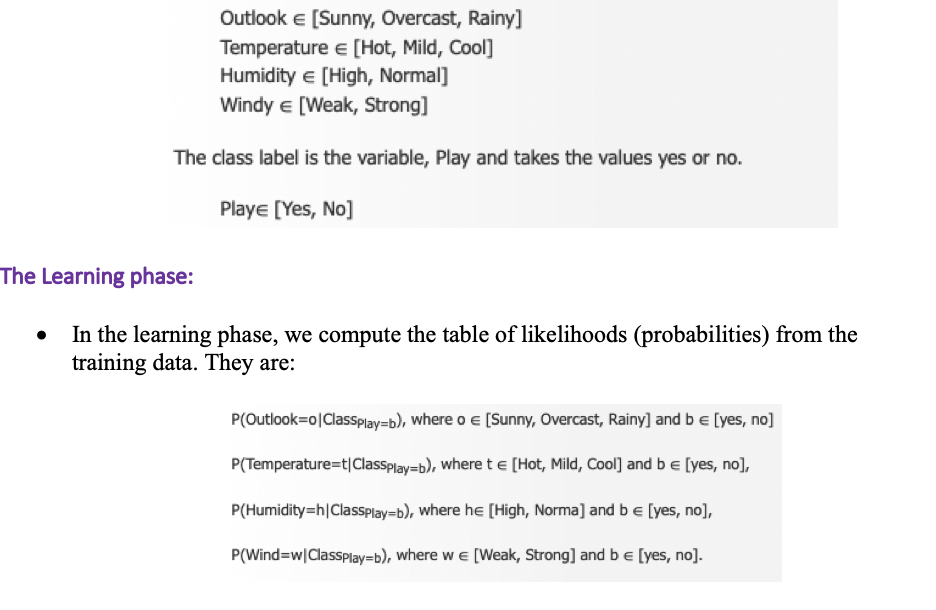

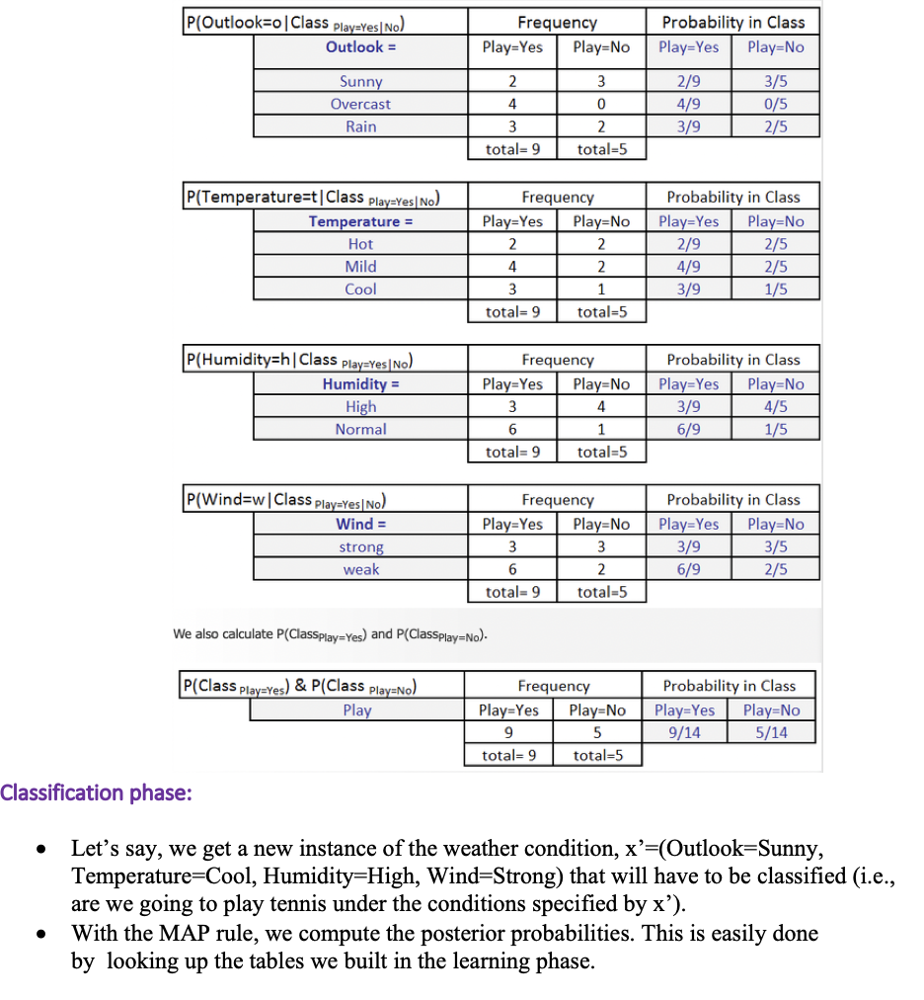

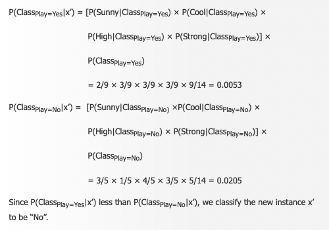

## Implementing Naive Bayes from Scratch


In [ ]:
class  NaiveBayes:

	"""
		Bayes Theorem:
										            Likelihood * Class prior probability
				Posterior Probability = -------------------------------------
											            Predictor prior probability
				
							  			      P(x|c) * p(c)
							   P(c|x) = ------------------ 
											           P(x)
	"""

	def __init__(self):

		"""
			Attributes:
				likelihoods: Likelihood of each feature per class
				class_priors: Prior probabilities of classes 
				pred_priors: Prior probabilities of features 
				features: All features of dataset

		"""
		self.features = list
		self.likelihoods = {}
		self.class_priors = {}
		self.pred_priors = {}

		self.X_train = np.array
		self.y_train = np.array
		self.train_size = int
		self.num_feats = int

	def fit(self, X, y):

		self.features = list(X.columns)
		self.X_train = X
		self.y_train = y
		self.train_size = X.shape[0]
		self.num_feats = X.shape[1]

		for feature in self.features:
			self.likelihoods[feature] = {}
			self.pred_priors[feature] = {}

			for feat_val in np.unique(self.X_train[feature]):
				self.pred_priors[feature].update({feat_val: 0})

				for outcome in np.unique(self.y_train):
					self.likelihoods[feature].update({feat_val+'_'+outcome:0})
					self.class_priors.update({outcome: 0})


		self._calc_class_prior()
		self._calc_likelihoods()
		self._calc_predictor_prior()

		print(self.likelihoods)
		print(self.class_priors)
		print(self.pred_priors)

	def _calc_class_prior(self):

		""" P(c) - Prior Class Probability """

		for outcome in np.unique(self.y_train):
			outcome_count = sum(self.y_train == outcome)
			self.class_priors[outcome] = outcome_count / self.train_size

	def _calc_likelihoods(self):

		""" P(x|c) - Likelihood """

		for feature in self.features:

			for outcome in np.unique(self.y_train):
				outcome_count = sum(self.y_train == outcome)
				feat_likelihood = self.X_train[feature][self.y_train[self.y_train == outcome].index.values.tolist()].value_counts().to_dict()

				for feat_val, count in feat_likelihood.items():
					self.likelihoods[feature][feat_val + '_' + outcome] = count/outcome_count


	def _calc_predictor_prior(self):

		""" P(x) - Evidence """

		for feature in self.features:
			feat_vals = self.X_train[feature].value_counts().to_dict()

			for feat_val, count in feat_vals.items():
				self.pred_priors[feature][feat_val] = count/self.train_size


	def predict(self, X):

		""" Calculates Posterior probability P(c|x) """

		results = []
		X = np.array(X)

		for query in X:
			probs_outcome = {}
			for outcome in np.unique(self.y_train):
				prior = self.class_priors[outcome]
				likelihood = 1
				evidence = 1

				for feat, feat_val in zip(self.features, query):
					likelihood *= self.likelihoods[feat][feat_val + '_' + outcome]
					evidence *= self.pred_priors[feat][feat_val]

				posterior = (likelihood * prior) / (evidence)

				probs_outcome[outcome] = posterior

			result = max(probs_outcome, key = lambda x: probs_outcome[x])
			results.append(result)

		return np.array(results)

## implementing accuracy score

In [ ]:
def accuracy_score(y_true, y_pred):

	"""	score = (y_true - y_pred) / len(y_true) """

	return round(float(sum(y_pred == y_true))/float(len(y_true)) * 100 ,2)

In [ ]:

	#print(X_train, y_train)
	nb_clf = NaiveBayes()
	nb_clf.fit(X_train, y_train)
	#print(X_train, y_train)

	print("Train Accuracy: {}".format(accuracy_score(y_train, nb_clf.predict(X_train))))
	print("Test Accuracy: {}".format(accuracy_score(y_test, nb_clf.predict(X_test))))
	
	#Query 1:
	query = np.array([['Rainy','Mild', 'Normal', 'Weak']])
	print("Query 1:- {} ---> {}".format(query, nb_clf.predict(query)))

	#Query 2:
	query = np.array([['Overcast','Cool', 'Normal', 'Strong']])
	print("Query 2:- {} ---> {}".format(query, nb_clf.predict(query)))

	#Query 3:
	query = np.array([['Sunny','Hot', 'High', 'Weak']])
	print("Query 3:- {} ---> {}".format(query, nb_clf.predict(query)))

{'Outlook': {'Overcast_no': 0, 'Overcast_yes': 0.5714285714285714, 'Rainy_no': 0.3333333333333333, 'Rainy_yes': 0.14285714285714285, 'Sunny_no': 0.6666666666666666, 'Sunny_yes': 0.2857142857142857}, 'Temperature': {'Cool_no': 0, 'Cool_yes': 0.2857142857142857, 'Hot_no': 0.3333333333333333, 'Hot_yes': 0.2857142857142857, 'Mild_no': 0.6666666666666666, 'Mild_yes': 0.42857142857142855}, 'Humidity': {'High_no': 1.0, 'High_yes': 0.2857142857142857, 'Normal_no': 0, 'Normal_yes': 0.7142857142857143}, 'Windy': {'Strong_no': 0.3333333333333333, 'Strong_yes': 0.42857142857142855, 'Weak_no': 0.6666666666666666, 'Weak_yes': 0.5714285714285714}}
{'no': 0.3, 'yes': 0.7}
{'Outlook': {'Overcast': 0.4, 'Rainy': 0.2, 'Sunny': 0.4}, 'Temperature': {'Cool': 0.2, 'Hot': 0.3, 'Mild': 0.5}, 'Humidity': {'High': 0.5, 'Normal': 0.5}, 'Windy': {'Strong': 0.4, 'Weak': 0.6}}
Train Accuracy: 100.0
Test Accuracy: 50.0
Query 1:- [['Rainy' 'Mild' 'Normal' 'Weak']] ---> ['yes']
Query 2:- [['Overcast' 'Cool' 'Normal' '

# Now lets implement Gaussian NB from Scratch

* In Gaussian NB liklihood of the features are assumed to be Gaussian.and we use pdf of the gaussian distribution to calculate the liklihoods.

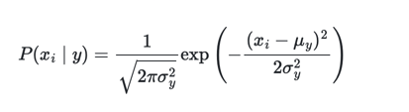


## Lets use Iris dataset for this case study



In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d arshid/iris-flower-dataset
!unzip iris-flower-dataset.zip 

Saving kaggle.json to kaggle.json
  0% 0.00/0.99k [00:00<?, ?B/s]
100% 0.99k/0.99k [00:00<00:00, 728kB/s]
Archive:  iris-flower-dataset.zip
  inflating: IRIS.csv                


## lets load the dataset and divide to train and test

In [ ]:
iris_data = pd.read_csv('IRIS.csv')
iris_data.head()
X = iris_data.drop([iris_data.columns[-1]], axis = 1)
y = iris_data[iris_data.columns[-1]]
test_size = 0.25
X_test = X.sample(frac = test_size, random_state = None)
y_test = y[X_test.index]
X_train = X.drop(X_test.index)
y_train = y.drop(y_test.index)

## Gaussian NB from scratch

In [ ]:
class  GaussianNB:

	"""
		Bayes Theorem:
										            Likelihood * Class prior probability
				Posterior Probability = -------------------------------------
											            Predictor prior probability
				
							  			        P(x|c) * p(c)
							   P(c|x) = ------------------ 
											            P(x)

		Gaussian Naive Bayes:

							         1								
				P(x|c) = --------------------------- * exp(- (x - mean)^2 / 2*(var(x)^2)))
						   sqrt(2 * pi * var(x)^2)	
	"""

	def __init__(self):

		"""
			Attributes:
				likelihoods: Likelihood of each feature per class
				class_priors: Prior probabilities of classes  
				features: All features of dataset

		"""
		self.features = list
		self.likelihoods = {}
		self.class_priors = {}

		self.X_train = np.array
		self.y_train = np.array
		self.train_size = int
		self.num_feats = int

	def fit(self, X, y):

		self.features = list(X.columns)
		self.X_train = X
		self.y_train = y
		self.train_size = X.shape[0]
		self.num_feats = X.shape[1]

		for feature in self.features:
			self.likelihoods[feature] = {}

			for outcome in np.unique(self.y_train):
				self.likelihoods[feature].update({outcome:{}})
				self.class_priors.update({outcome: 0})


		self._calc_class_prior()
		self._calc_likelihoods()

		# print(self.likelihoods)
		# print(self.class_priors)

	def _calc_class_prior(self):

		""" P(c) - Prior Class Probability """

		for outcome in np.unique(self.y_train):
			outcome_count = sum(self.y_train == outcome)
			self.class_priors[outcome] = outcome_count / self.train_size

	def _calc_likelihoods(self):

		""" P(x|c) - Likelihood """

		for feature in self.features:

			for outcome in np.unique(self.y_train):
				self.likelihoods[feature][outcome]['mean'] = self.X_train[feature][self.y_train[self.y_train == outcome].index.values.tolist()].mean()
				self.likelihoods[feature][outcome]['variance'] = self.X_train[feature][self.y_train[self.y_train == outcome].index.values.tolist()].var()


	def predict(self, X):

		""" Calculates Posterior probability P(c|x) """

		results = []
		X = np.array(X)

		for query in X:
			probs_outcome = {}
		
			"""
			 	Note: No Need to calculate evidence i.e P(x) since it is constant fot the given sample. as mean and variance for every x is same as all x comes from same distribution.
			          Therfore, it does not affect classification and can be ignored
			"""
			for outcome in np.unique(self.y_train):
				prior = self.class_priors[outcome]
				likelihood = 1
				evidence_temp = 1

				for feat, feat_val in zip(self.features, query):
					mean = self.likelihoods[feat][outcome]['mean']
					var = self.likelihoods[feat][outcome]['variance']
					likelihood *= (1/math.sqrt(2*math.pi*var)) * np.exp(-(feat_val - mean)**2 / (2*var))

				posterior_numerator = (likelihood * prior)
				probs_outcome[outcome] = posterior_numerator

		
			result = max(probs_outcome, key = lambda x: probs_outcome[x])
			results.append(result)

		return np.array(results)

### Lets fit and predict on Iris Data

In [ ]:
classifier = GaussianNB()
classifier.fit(X_train, y_train)
#print(X_train, y_train)

print("Train Accuracy: {}".format(accuracy_score(y_train, classifier.predict(X_train))))
print("Test Accuracy: {}".format(accuracy_score(y_test, classifier.predict(X_test))))

#Query 1:
query = np.array([[5.7, 2.9, 4.2, 1.3]])
print("Query 1:- {} ---> {}".format(query, classifier.predict(query)))

Train Accuracy: 95.54
Test Accuracy: 97.37
Query 1:- [[5.7 2.9 4.2 1.3]] ---> ['Iris-versicolor']
